# **Image Compression Techniques**

**Lossloss Compression**

Image saved as PNG at compressed_image.png


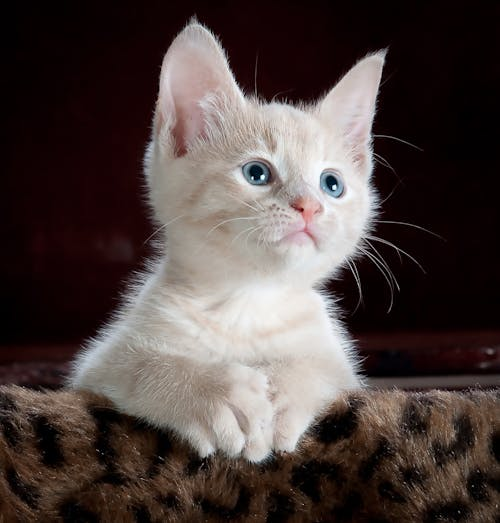

In [ ]:
from PIL import Image

def compress_image(input_path, output_path):
    img = Image.open(input_path)
    img.save(output_path, format='PNG', optimize=True)
    print(f"Image saved as PNG at {output_path}")


# Example usage
input_path = '/content/drive/MyDrive/cat1.jpeg'
output_path = 'compressed_image.png'

compress_image(input_path, output_path)
Image.open('compressed_image.png')



In [ ]:
import os

def get_file_size(path):
    # Get the size of the file in bytes
    return os.path.getsize(path)

# Example usage
input_path = '/content/drive/MyDrive/cat1.jpeg'
output_path = 'compressed_image.png'

original_size = get_file_size(input_path)
compressed_size = get_file_size(output_path)

compression_ratio = original_size / compressed_size

print(f'Original file size: {original_size} bytes')
print(f'Compressed file size: {compressed_size} bytes')
print(f'Compression ratio: {compression_ratio:.2f}')


Original file size: 28815 bytes
Compressed file size: 275277 bytes
Compression ratio: 0.10


**DEFLATE Algorithm**


1.   
It means combinations of LZ77 and Huffman coding...




In [ ]:
import zlib

def compress_image(image_data):
    # Apply DEFLATE compression to the image data
    compressed_data = zlib.compress(image_data, level=-1)  # level=-1 indicates using the default compression level
    return compressed_data

def decompress_image(compressed_data):
    # Decompress the compressed image data
    decompressed_data = zlib.decompress(compressed_data)
    return decompressed_data

# Example usage
with open('/content/drive/MyDrive/cat1.jpeg', 'rb') as f:
    image_data = f.read()
compressed_data = compress_image(image_data)
original_size = len(image_data)
compressed_size = len(compressed_data)
compression_ratio = original_size / compressed_size

print(f'Original size: {original_size} bytes')
print(f'Compressed size: {compressed_size} bytes')
print(f'Compression ratio: {compression_ratio:.2f}')

# Decompress the compressed data (optional)
# decompressed_data = decompress_image(compressed_data)
# plt.subplot(1,2,1)

Original size: 28815 bytes
Compressed size: 28519 bytes
Compression ratio: 1.01


**LZ77 Coding Technique**

Original size: 261500 bytes
Compressed size: 562488 bytes
Compression ratio: 0.46


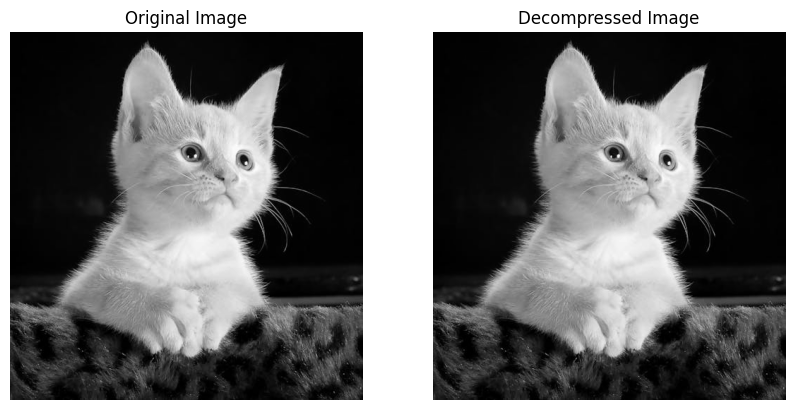

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import sys

def lz77_compress_image(image_data, window_size=4096, lookahead_buffer_size=15):
    compressed_data = []
    pos = 0

    # Flatten image data for processing
    flat_image_data = image_data.flatten()

    while pos < len(flat_image_data):
        max_match_length = 0
        max_match_offset = 0

        # Search for the longest match within the window
        for i in range(1, min(window_size, pos) + 1):
            match_length = 0
            while match_length < lookahead_buffer_size and pos + match_length < len(flat_image_data) and flat_image_data[pos + match_length] == flat_image_data[pos - i + match_length]:
                match_length += 1

            if match_length > max_match_length:
                max_match_length = match_length
                max_match_offset = i

        # Output the match
        if max_match_length > 0:
            if pos + max_match_length < len(flat_image_data):
                compressed_data.append((max_match_offset, max_match_length, flat_image_data[pos + max_match_length]))
            else:
                compressed_data.append((max_match_offset, max_match_length, None))
            pos += max_match_length + 1
        else:
            compressed_data.append((0, 0, flat_image_data[pos]))
            pos += 1

    return compressed_data

def lz77_decompress_image(compressed_data, image_shape):
    decompressed_data = np.zeros(np.prod(image_shape), dtype=np.uint8)
    pos = 0

    for offset, length, pixel in compressed_data:
        if offset == 0:
            decompressed_data[pos] = pixel
            pos += 1
        else:
            for i in range(length):
                decompressed_data[pos] = decompressed_data[pos - offset]
                pos += 1
            if pixel is not None:
                decompressed_data[pos] = pixel
                pos += 1

    # Reshape the decompressed data to the original image shape
    return decompressed_data.reshape(image_shape)

def calculate_compression_ratio(original_data, compressed_data):
    original_size = original_data.nbytes
    compressed_size = sys.getsizeof(compressed_data)
    compression_ratio = original_size / compressed_size
    return original_size, compressed_size, compression_ratio

# Example usage
input_image_path = '/content/drive/MyDrive/cat1.jpeg'
output_image_path = 'decompressed_image.png'

# Load the image
input_image = Image.open(input_image_path).convert('L')  # Convert to grayscale for simplicity
image_data = np.array(input_image)

# Compress the image
compressed_data = lz77_compress_image(image_data)

# Decompress the compressed data
decompressed_data = lz77_decompress_image(compressed_data, image_data.shape)

# Save the decompressed image
output_image = Image.fromarray(decompressed_data)
output_image.save(output_image_path)

# Calculate compression ratio
original_size, compressed_size, compression_ratio = calculate_compression_ratio(image_data, compressed_data)

print(f'Original size: {original_size} bytes')
print(f'Compressed size: {compressed_size} bytes')
print(f'Compression ratio: {compression_ratio:.2f}')

# Visualization
plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image_data, cmap='gray')
plt.axis('off')

# Decompressed Image
plt.subplot(1, 2, 2)
plt.title('Decompressed Image')
plt.imshow(decompressed_data, cmap='gray')
plt.axis('off')
plt.show()

compressed_data is [0, 1, 256, 258, 257, 259, 262, 261, 264, 260, 266, 263, 267, 265, 259, 4, 257, 272, 1, 274, 276, 273, 278, 275, 279, 277, 280, 283, 282, 277, 0, 272, 287, 0, 289, 291, 288, 293, 290, 294, 292, 295, 298, 297, 300, 296, 302, 299, 303, 301, 304, 290, 3, 256, 309, 0, 5, 1, 312, 314, 313, 315, 318, 317, 6, 290, 321, 0, 323, 325, 322, 290, 8, 328, 327, 324, 331, 326, 332, 0, 329, 336, 330, 338, 340, 337, 9, 290, 343, 0, 345, 345, 10, 257, 349, 1, 351, 353, 350, 355, 352, 356, 354, 357, 360, 359, 343, 1, 363, 7, 1, 1, 366, 368, 367, 369, 369, 363, 374, 257, 363, 359, 378, 356, 12, 290, 381, 0, 383, 385, 382, 387, 384, 388, 386, 389, 392, 391, 383, 14, 290, 396, 0, 398, 400, 397, 402, 399, 403, 401, 0, 15, 367, 408, 1, 410, 16, 2, 2, 413, 2, 410, 418, 409, 420, 411, 421, 410, 406, 425, 405, 403, 16, 257, 429, 1, 431, 433, 430, 435, 432, 436, 434, 437, 440, 439, 419, 1, 13, 367, 445, 444, 446, 449, 448, 451, 447, 453, 450, 454, 452, 367, 394, 390, 460, 393, 461, 459, 462, 39

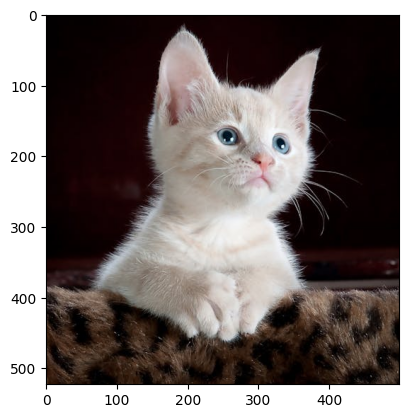

In [ ]:
import numpy as np
from PIL import Image

def lzw_compress(data):
    dictionary_size = 256
    dictionary = {chr(i): i for i in range(dictionary_size)}
    result = []
    w = ""
    for c in data:
        wc = w + c
        if wc in dictionary:
            w = wc
        else:
            result.append(dictionary[w])
            dictionary[wc] = dictionary_size
            dictionary_size += 1
            w = c
    if w:
        result.append(dictionary[w])
    return result

def lzw_decompress(compressed_data):
    dictionary_size = 256
    dictionary = {i: chr(i) for i in range(dictionary_size)}
    result = []
    w = chr(compressed_data.pop(0))
    result.append(ord(w))
    for k in compressed_data:
        if k in dictionary:
            entry = dictionary[k]
        elif k == dictionary_size:
            entry = w + w[0]
        else:
            raise ValueError("Bad compressed k: %s" % k)
        for char in entry:
            result.append(ord(char))
        dictionary[dictionary_size] = w + entry[0]
        dictionary_size += 1
        w = entry
    return result

def visualize_image(image_data, height, width):
    # Convert the image data to numpy array
    image_array = np.array(image_data).reshape((height, width, 3)).astype(np.uint8)

    # Create a PIL image from the numpy array
    image = Image.fromarray(image_array)

    # Show the image
    return image

# Example usage
image_path = "/content/drive/MyDrive/cat1.jpeg"
compressed_data, height, width = compress_image(image_path)

# Decompress the data
decompressed_data = lzw_decompress(compressed_data)

# Visualize the image
img=visualize_image(decompressed_data, height, width)
plt.imshow(img)
original_size = width * height
print('compressed_data is',compressed_data)
print('The size of encoded output',len(compressed_data))
print('original size',width*height)
reduction_size = original_size - len(compressed_data)
print('reduction size of LZW is',original_size - len(compressed_data))
reduction_percentage = (reduction_size / original_size) * 100
print(f'Percentage of compressed data using LZW: {reduction_percentage:.2f}%')
print("Compression completed.")


**RLE (Run-Length Encoding)**

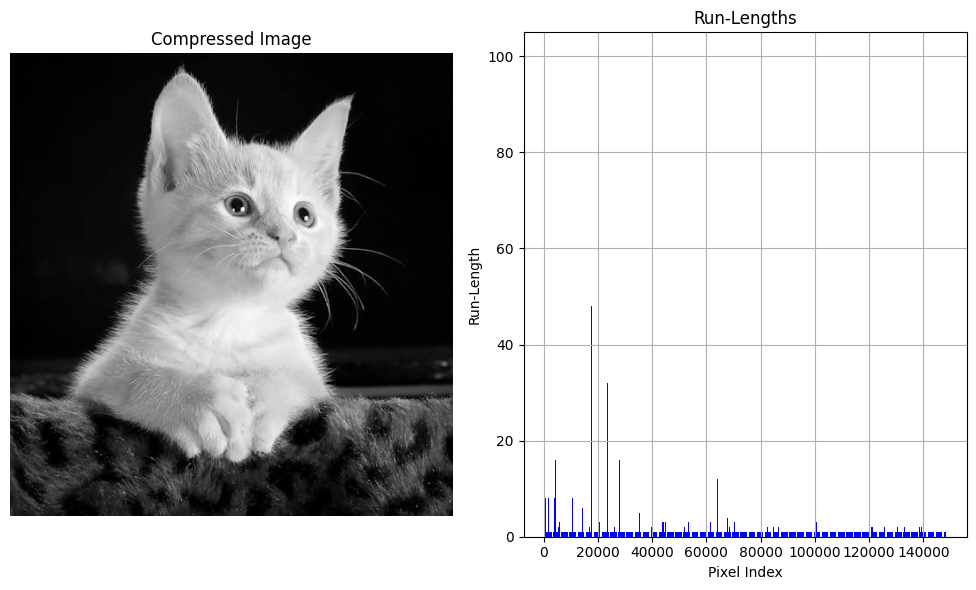

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def compress_rle(image):
    compressed_data = []
    current_pixel = None
    run_length = 0

    for pixel in np.nditer(image):
        if pixel != current_pixel:
            if current_pixel is not None:
                compressed_data.append((current_pixel, run_length))
            current_pixel = pixel
            run_length = 1
        else:
            run_length += 1

    compressed_data.append((current_pixel, run_length))

    return compressed_data

# Load an image
image_path = "/content/drive/MyDrive/cat1.jpeg"
image = np.array(Image.open(image_path).convert("L"))  # Convert to grayscale

# Compress the image using RLE
compressed_data = compress_rle(image)

# Visualize the compressed data
plt.figure(figsize=(10, 6))

compressed_pixels = [pixel for pixel, run_length in compressed_data for _ in range(run_length)]
plt.subplot(1, 2, 1)
plt.imshow(np.array(compressed_pixels).reshape(image.shape), cmap='gray')
plt.title('Compressed Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.bar(range(len(compressed_data)), [run_length for pixel, run_length in compressed_data], color='blue')
plt.title('Run-Lengths')
plt.xlabel('Pixel Index')
plt.ylabel('Run-Length')
plt.grid(True)

plt.tight_layout()
plt.show()


Compression ratio: 0.87


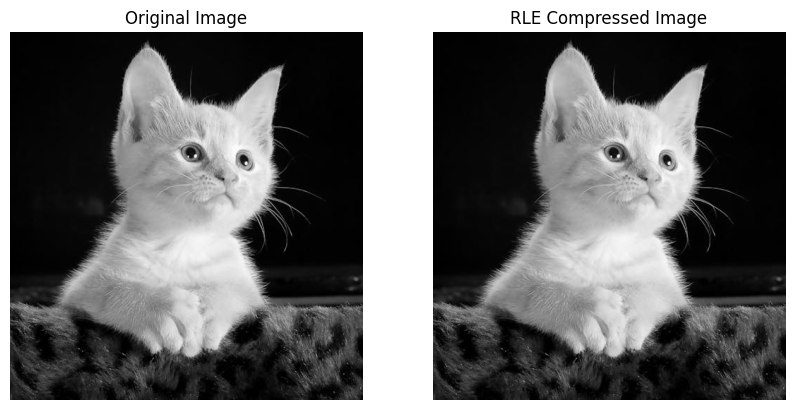

Horizontal RLE Vectors:
[(1, 64), (2, 28), (3, 36), (4, 27), (5, 3), (6, 2), (5, 8), (4, 8), (5, 32), (4, 17), (5, 3), (6, 3), (7, 1), (6, 16), (5, 8), (6, 16), (4, 8), (5, 8), (4, 8), (3, 8), (4, 24), (2, 40), (1, 8), (2, 48), (1, 8), (2, 8), (3, 24), (2, 32), (1, 4)]
[(1, 64), (2, 28), (3, 36), (4, 27), (5, 3), (6, 2), (5, 8), (4, 8), (5, 32), (4, 17), (5, 3), (6, 3), (7, 1), (6, 16), (5, 8), (6, 16), (5, 16), (4, 8), (3, 8), (4, 24), (2, 40), (1, 8), (2, 64), (3, 24), (2, 36)]
[(1, 64), (2, 28), (3, 36), (4, 27), (5, 3), (6, 2), (5, 8), (4, 8), (5, 32), (4, 17), (5, 3), (6, 3), (7, 1), (6, 40), (5, 16), (4, 40), (2, 40), (1, 8), (2, 64), (3, 24), (2, 36)]
[(1, 64), (2, 28), (3, 36), (4, 27), (5, 3), (6, 2), (5, 48), (4, 17), (5, 3), (6, 3), (7, 1), (6, 40), (5, 24), (4, 32), (2, 40), (1, 8), (2, 64), (3, 24), (2, 36)]
[(1, 64), (2, 28), (3, 36), (4, 27), (5, 3), (6, 2), (5, 48), (4, 17), (5, 3), (6, 3), (7, 1), (6, 48), (5, 16), (4, 32), (2, 40), (1, 8), (2, 48), (3, 8), (2, 8), (3,

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def rle_encode(data):
    encoding = []
    prev_pixel = data[0]
    count = 1

    for pixel in data[1:]:
        if pixel == prev_pixel:
            count += 1
        else:
            encoding.append((prev_pixel, count))
            prev_pixel = pixel
            count = 1

    encoding.append((prev_pixel, count))
    return encoding

def rle_decode(encoded_data):
    decoded_data = []
    for pixel, count in encoded_data:
        decoded_data.extend([pixel] * count)
    return decoded_data

def calculate_compression_ratio(original_size, encoded_data):
    encoded_size = sum([1 + len(str(count)) for _, count in encoded_data])  # pixel + count
    return original_size / encoded_size

def visualize_rle(encoded_data, image_shape, title):
    decoded_data = rle_decode(encoded_data)
    decoded_image = np.array(decoded_data).reshape(image_shape)
    plt.imshow(decoded_image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Load and preprocess image
path = '/content/drive/MyDrive/cat1.jpeg'
image = np.asarray(Image.open(path).convert('L'))  # Convert to grayscale

# Flatten the image array for RLE
flat_image = image.flatten()

# Apply RLE
encoded_data = rle_encode(flat_image)
decoded_data = rle_decode(encoded_data)

# Calculate compression ratio
original_size = len(flat_image)
compression_ratio = calculate_compression_ratio(original_size, encoded_data)
print(f"Compression ratio: {compression_ratio:.2f}")

# Visualize original and RLE compressed image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
visualize_rle(encoded_data, image.shape, 'RLE Compressed Image')

# Display vectors for horizontal and vertical RLE (if needed)
horizontal_rle = [rle_encode(row) for row in image]
vertical_rle = [rle_encode(col) for col in image.T]

print("Horizontal RLE Vectors:")
for row in horizontal_rle[:5]:  # Display first 5 rows for brevity
    print(row)

print("Vertical RLE Vectors:")
for col in vertical_rle[:5]:  # Display first 5 columns for brevity
    print(col)


**Huffman Coding**

In [ ]:
path ='/content/drive/MyDrive/cat1.jpeg'

image = np.asarray(Image.open(path))

pixels = []

for row in image:
  for ch in row:
    for pix in ch:
      pixels.append(pix)

class Node:

  def __init__(self, prob, symbol, left=None, right=None):
      # probability of symbol
    self.prob = prob

    # symbol
    self.symbol = symbol

    # left node
    self.left = left

    # right node
    self.right = right

    # tree direction (0/1)
    self.code = ''

""" A function to print the codes of symbols by traveling Huffman Tree"""

codes = dict()

def Calculate_Codes(node, val=''):
    # huffman code for current node
    newVal = val + str(node.code)

    if(node.left):
        Calculate_Codes(node.left, newVal)
    if(node.right):
        Calculate_Codes(node.right, newVal)

    if(not node.left and not node.right):
        codes[node.symbol] = newVal

    return codes

""" A  function to get the probabilities of symbols in given data"""

def Calculate_Probability(data):
    symbols = dict()
    for element in data:
        if symbols.get(element) == None:
            symbols[element] = 1
        else:
            symbols[element] += 1
    return symbols

""" A function to obtain the encoded output"""

def Output_Encoded(data, coding):
    encoding_output = []
    for c in data:
      encoding_output.append(coding[c])

      string = ''.join([str(item) for item in encoding_output])
      return string

""" A function to calculate the space difference between compressed and non compressed data"""

def Total_Gain(data, coding):
      before_compression = len(data) * 8 # total bit space to stor              the data before compression
      after_compression = 0
      symbols = coding.keys()
      for symbol in symbols:
        count = data.count(symbol)
        after_compression += count * len(coding[symbol]) #calculate how  many bit is required for that symbol in total
        print("Space usage before compression (in bits):", before_compression)
        print("Space usage after compression (in bits):",    after_compression)

def Huffman_Encoding(data):
    symbol_with_probs = Calculate_Probability(data)
    symbols = symbol_with_probs.keys()
    probabilities = symbol_with_probs.values()
    print("symbols: ", symbols)
    print("probabilities: ", probabilities)

    nodes = []

    # converting symbols and probabilities into huffman tree nodes
    for symbol in symbols:
        nodes.append(Node(symbol_with_probs.get(symbol), symbol))

    while len(nodes) > 1:
          # sort all the nodes in ascending order based on their probability
          nodes = sorted(nodes, key=lambda x: x.prob)
          # for node in nodes:
    #     print(node.symbol, node.prob)

    # pick 2 smallest nodes
          right = nodes[0]
          left = nodes[1]

          left.code = 0
          right.code = 1

    # combine the 2 smallest nodes to create new node
          newNode = Node(left.prob+right.prob, left.symbol+right.symbol, left, right)

          nodes.remove(left)
          nodes.remove(right)
          nodes.append(newNode)

    huffman_encoding = Calculate_Codes(nodes[0])
    print("symbols with codes", huffman_encoding)
    Total_Gain(data, huffman_encoding)
    encoded_output = Output_Encoded(data,huffman_encoding)
    return encoded_output, nodes[0]

encoding, tree = Huffman_Encoding(pixels)

file = open('compressed.txt','w')

file.write(encoding)

file.close()

symbols:  dict_keys([2, 0, 1, 4, 3, 5, 6, 8, 9, 10, 7, 12, 14, 15, 16, 13, 17, 19, 18, 11, 20, 21, 23, 22, 26, 27, 36, 44, 28, 29, 24, 25, 52, 33, 35, 67, 48, 50, 60, 45, 80, 64, 42, 30, 38, 70, 68, 77, 73, 66, 58, 46, 31, 85, 75, 76, 69, 63, 61, 57, 56, 71, 74, 54, 55, 32, 41, 39, 93, 81, 109, 103, 107, 82, 83, 72, 95, 86, 89, 34, 104, 97, 118, 112, 116, 113, 108, 111, 119, 115, 49, 65, 110, 121, 117, 124, 120, 128, 122, 142, 136, 138, 88, 84, 51, 79, 78, 129, 125, 126, 156, 152, 153, 96, 90, 94, 37, 132, 131, 163, 161, 162, 137, 135, 123, 47, 87, 106, 160, 158, 151, 167, 169, 168, 139, 140, 144, 147, 148, 114, 59, 149, 150, 145, 146, 143, 174, 176, 173, 175, 164, 179, 183, 186, 134, 102, 91, 105, 130, 155, 154, 171, 172, 170, 187, 189, 191, 190, 182, 185, 188, 194, 197, 184, 181, 177, 178, 180, 192, 202, 196, 200, 203, 99, 101, 165, 166, 157, 210, 214, 217, 98, 159, 141, 198, 201, 195, 92, 100, 40, 43, 219, 222, 127, 212, 220, 223, 211, 216, 133, 208, 207, 205, 215, 209, 193, 53, 204

<ipython-input-9-67c9a862fd5f>:108: RuntimeWarning: overflow encountered in scalar add
  newNode = Node(left.prob+right.prob, left.symbol+right.symbol, left, right)


Space usage before compression (in bits): 6276000
Space usage after compression (in bits): 55134
Space usage before compression (in bits): 6276000
Space usage after compression (in bits): 73458
Space usage before compression (in bits): 6276000
Space usage after compression (in bits): 91764
Space usage before compression (in bits): 6276000
Space usage after compression (in bits): 110070
Space usage before compression (in bits): 6276000
Space usage after compression (in bits): 128349
Space usage before compression (in bits): 6276000
Space usage after compression (in bits): 138529
Space usage before compression (in bits): 6276000
Space usage after compression (in bits): 148639
Space usage before compression (in bits): 6276000
Space usage after compression (in bits): 166873
Space usage before compression (in bits): 6276000
Space usage after compression (in bits): 185080
Space usage before compression (in bits): 6276000
Space usage after compression (in bits): 203269
Space usage before comp

<ipython-input-11-a5a102170456>:74: RuntimeWarning: overflow encountered in scalar add
  newNode = Node(left.prob+right.prob, left.symbol+right.symbol, left, right)


symbols with codes {172: '000000000', 47: '000000001', 189: '000000010', 156: '000000011', 165: '000000100', 148: '000000101', 195: '000000110', 116: '0000001110', 236: '0000001111', 153: '000001000', 45: '000001001', 141: '000001010', 139: '000001011', 27: '00000110', 138: '000001110', 187: '000001111', 188: '000010000', 46: '000010001', 239: '0000100100', 115: '0000100101', 150: '000010011', 190: '000010100', 227: '000010101', 147: '000010110', 174: '000010111', 12: '0000110', 146: '000011100', 193: '000011101', 154: '000011110', 192: '000011111', 1: '0001', 25: '00100000', 83: '0010000100', 114: '0010000101', 162: '001000011', 19: '0010001', 85: '0010010000', 84: '0010010001', 175: '001001001', 143: '001001010', 230: '001001011', 173: '001001100', 228: '001001101', 186: '001001110', 137: '001001111', 2: '00101', 194: '001100000', 86: '0011000010', 113: '0011000011', 28: '00110001', 170: '001100100', 169: '001100101', 176: '001100110', 145: '001100111', 149: '001101000', 185: '001101

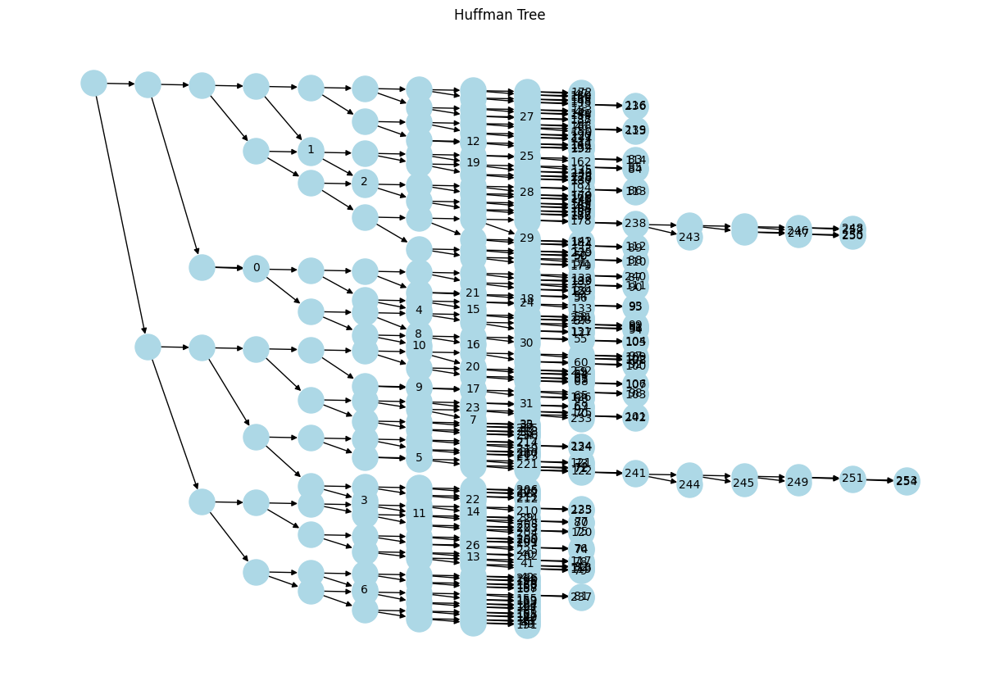

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import heapq
from collections import defaultdict, Counter
import networkx as nx

class Node:
    def __init__(self, prob, symbol, left=None, right=None):
        self.prob = prob
        self.symbol = symbol
        self.left = left
        self.right = right
        self.code = ''

def Calculate_Codes(node, val=''):
    newVal = val + str(node.code)

    if(node.left):
        Calculate_Codes(node.left, newVal)
    if(node.right):
        Calculate_Codes(node.right, newVal)

    if(not node.left and not node.right):
        codes[node.symbol] = newVal

    return codes

def Calculate_Probability(data):
    symbols = dict()
    for element in data:
        if symbols.get(element) == None:
            symbols[element] = 1
        else:
            symbols[element] += 1
    return symbols

def Output_Encoded(data, coding):
    encoding_output = []
    for c in data:
        encoding_output.append(coding[c])

    string = ''.join([str(item) for item in encoding_output])
    return string

def Total_Gain(data, coding):
    before_compression = len(data) * 8
    after_compression = 0
    symbols = coding.keys()
    for symbol in symbols:
        count = data.count(symbol)
        after_compression += count * len(coding[symbol])
    print("Space usage before compression (in bits):", before_compression)
    print("Space usage after compression (in bits):", after_compression)

def Huffman_Encoding(data):
    symbol_with_probs = Calculate_Probability(data)
    symbols = symbol_with_probs.keys()
    probabilities = symbol_with_probs.values()

    nodes = []

    for symbol in symbols:
        nodes.append(Node(symbol_with_probs.get(symbol), symbol))

    while len(nodes) > 1:
        nodes = sorted(nodes, key=lambda x: x.prob)
        right = nodes[0]
        left = nodes[1]

        left.code = 0
        right.code = 1

        newNode = Node(left.prob+right.prob, left.symbol+right.symbol, left, right)

        nodes.remove(left)
        nodes.remove(right)
        nodes.append(newNode)

    huffman_encoding = Calculate_Codes(nodes[0])
    print("symbols with codes", huffman_encoding)
    Total_Gain(data, huffman_encoding)
    encoded_output = Output_Encoded(data, huffman_encoding)
    return encoded_output, nodes[0]
def visualize_huffman_tree(node, graph=None, pos=None, level=0, label=''):
    if graph is None:
        graph = nx.DiGraph()
        pos = {}

    if not node.left and not node.right:
        graph.add_node(label, label=str(node.symbol))
        pos[label] = (level, -len(pos))
    else:
        graph.add_node(label, label='')
        pos[label] = (level, -len(pos))
        if node.left:
            graph.add_edge(label, label + '0')
            visualize_huffman_tree(node.left, graph, pos, level + 1, label + '0')
        if node.right:
            graph.add_edge(label, label + '1')
            visualize_huffman_tree(node.right, graph, pos, level + 1, label + '1')

    return graph, pos

# Load and preprocess image
path = '/content/drive/MyDrive/cat1.jpeg'
image = np.asarray(Image.open(path))

pixels = []

for row in image:
    for ch in row:
        for pix in ch:
            pixels.append(pix)

codes = dict()
encoding, tree = Huffman_Encoding(pixels)


# Visualize the Huffman tree
graph, pos = visualize_huffman_tree(tree)
plt.figure(figsize=(12, 8))
nx.draw(graph, pos, with_labels=True, labels=nx.get_node_attributes(graph, 'label'), node_size=500, node_color='lightblue', font_size=10)
plt.title('Huffman Tree')
plt.show()



<ipython-input-16-c25a6a8ffeaa>:75: RuntimeWarning: overflow encountered in scalar add
  newNode = Node(left.prob+right.prob, left.symbol+right.symbol, left, right)


symbols with codes {172: '000000000', 47: '000000001', 189: '000000010', 156: '000000011', 165: '000000100', 148: '000000101', 195: '000000110', 116: '0000001110', 236: '0000001111', 153: '000001000', 45: '000001001', 141: '000001010', 139: '000001011', 27: '00000110', 138: '000001110', 187: '000001111', 188: '000010000', 46: '000010001', 239: '0000100100', 115: '0000100101', 150: '000010011', 190: '000010100', 227: '000010101', 147: '000010110', 174: '000010111', 12: '0000110', 146: '000011100', 193: '000011101', 154: '000011110', 192: '000011111', 1: '0001', 25: '00100000', 83: '0010000100', 114: '0010000101', 162: '001000011', 19: '0010001', 85: '0010010000', 84: '0010010001', 175: '001001001', 143: '001001010', 230: '001001011', 173: '001001100', 228: '001001101', 186: '001001110', 137: '001001111', 2: '00101', 194: '001100000', 86: '0011000010', 113: '0011000011', 28: '00110001', 170: '001100100', 169: '001100101', 176: '001100110', 145: '001100111', 149: '001101000', 185: '001101

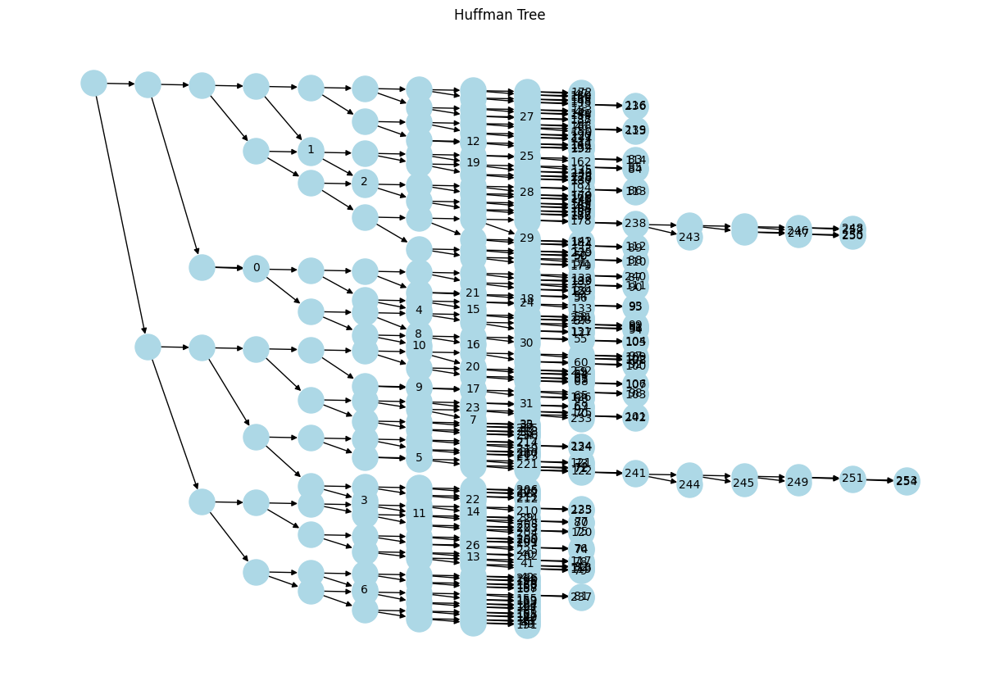

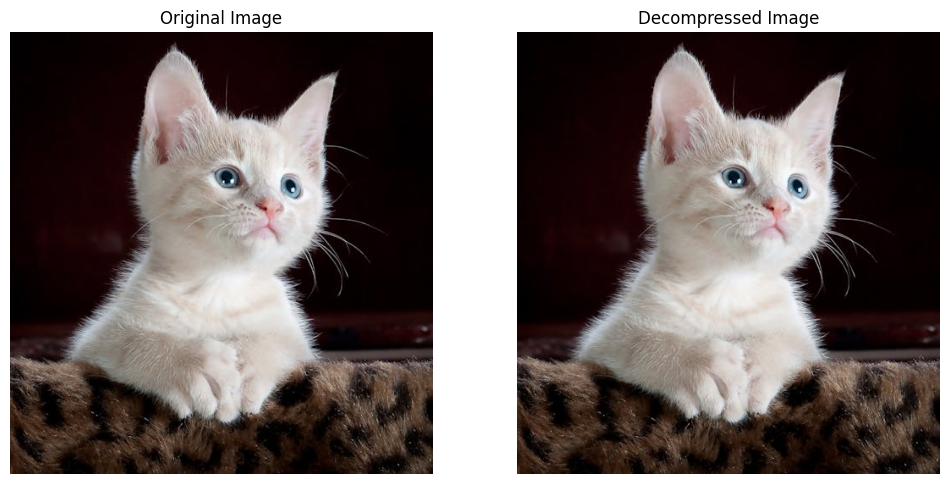

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import heapq
from collections import defaultdict, Counter
import networkx as nx

class Node:
    def __init__(self, prob, symbol, left=None, right=None):
        self.prob = prob
        self.symbol = symbol
        self.left = left
        self.right = right
        self.code = ''

def Calculate_Codes(node, val=''):
    newVal = val + str(node.code)

    if(node.left):
        Calculate_Codes(node.left, newVal)
    if(node.right):
        Calculate_Codes(node.right, newVal)

    if(not node.left and not node.right):
        codes[node.symbol] = newVal

    return codes

def Calculate_Probability(data):
    symbols = dict()
    for element in data:
        if symbols.get(element) == None:
            symbols[element] = 1
        else:
            symbols[element] += 1
    return symbols

def Output_Encoded(data, coding):
    encoding_output = []
    for c in data:
        encoding_output.append(coding[c])

    string = ''.join([str(item) for item in encoding_output])
    return string

def Total_Gain(data, coding):
    before_compression = len(data) * 8
    after_compression = 0
    unique, counts = np.unique(data, return_counts=True)
    symbol_counts = dict(zip(unique, counts))
    for symbol in coding:
        after_compression += symbol_counts[symbol] * len(coding[symbol])
    print("Space usage before compression (in bits):", before_compression)
    print("Space usage after compression (in bits):", after_compression)
    return before_compression, after_compression

def Huffman_Encoding(data):
    symbol_with_probs = Calculate_Probability(data)
    symbols = symbol_with_probs.keys()
    probabilities = symbol_with_probs.values()

    nodes = []

    for symbol in symbols:
        nodes.append(Node(symbol_with_probs.get(symbol), symbol))

    while len(nodes) > 1:
        nodes = sorted(nodes, key=lambda x: x.prob)
        right = nodes[0]
        left = nodes[1]

        left.code = 0
        right.code = 1

        newNode = Node(left.prob+right.prob, left.symbol+right.symbol, left, right)

        nodes.remove(left)
        nodes.remove(right)
        nodes.append(newNode)

    huffman_encoding = Calculate_Codes(nodes[0])
    print("symbols with codes", huffman_encoding)
    before_compression, after_compression = Total_Gain(data, huffman_encoding)
    encoded_output = Output_Encoded(data, huffman_encoding)
    return encoded_output, nodes[0], before_compression, after_compression

def visualize_huffman_tree(node, graph=None, pos=None, level=0, label=''):
    if graph is None:
        graph = nx.DiGraph()
        pos = {}

    if not node.left and not node.right:
        graph.add_node(label, label=str(node.symbol))
        pos[label] = (level, -len(pos))
    else:
        graph.add_node(label, label='')
        pos[label] = (level, -len(pos))
        if node.left:
            graph.add_edge(label, label + '0')
            visualize_huffman_tree(node.left, graph, pos, level + 1, label + '0')
        if node.right:
            graph.add_edge(label, label + '1')
            visualize_huffman_tree(node.right, graph, pos, level + 1, label + '1')

    return graph, pos

def decode_huffman(encoded_data, tree):
    decoded_output = []
    current_node = tree
    for bit in encoded_data:
        if bit == '0':
            current_node = current_node.left
        else:
            current_node = current_node.right

        if not current_node.left and not current_node.right:
            decoded_output.append(current_node.symbol)
            current_node = tree

    return decoded_output

# Load and preprocess image
path = '/content/drive/MyDrive/cat1.jpeg'
image = np.asarray(Image.open(path))

# Flatten image to 1D array for encoding
pixels = image.flatten()

codes = dict()
encoding, tree, before_compression, after_compression = Huffman_Encoding(pixels)

# Calculate compression ratio
compression_ratio = before_compression / after_compression
print(f'Compression ratio: {compression_ratio:.2f}')

# Visualize the Huffman tree
graph, pos = visualize_huffman_tree(tree)
plt.figure(figsize=(12, 8))
nx.draw(graph, pos, with_labels=True, labels=nx.get_node_attributes(graph, 'label'), node_size=500, node_color='lightblue', font_size=10)
plt.title('Huffman Tree')
plt.show()

# Decode the Huffman encoded data
decoded_pixels = decode_huffman(encoding, tree)
decoded_image = np.array(decoded_pixels).reshape(image.shape)

# Visualization of the original and decompressed images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Decompressed Image')
plt.imshow(decoded_image, cmap='gray')
plt.axis('off')

plt.show()


# **Lossy Compresssion**

In [ ]:
import numpy as np
from scipy.fftpack import dct, idct
from PIL import Image

def blockwise_dct(image, block_size=8):
    """Apply DCT to image in a block-wise manner"""
    height, width = image.shape
    dct_image = np.zeros_like(image)

    for row in range(0, height, block_size):
        for col in range(0, width, block_size):
            block = image[row:row+block_size, col:col+block_size]
            dct_block = dct(dct(block, axis=0, norm='ortho'), axis=1, norm='ortho')
            dct_image[row:row+block_size, col:col+block_size] = dct_block

    return dct_image

def blockwise_idct(dct_image, block_size=8):
    """Apply inverse DCT to DCT image in a block-wise manner"""
    height, width = dct_image.shape
    image = np.zeros_like(dct_image)

    for row in range(0, height, block_size):
        for col in range(0, width, block_size):
            dct_block = dct_image[row:row+block_size, col:col+block_size]
            block = idct(idct(dct_block, axis=0, norm='ortho'), axis=1, norm='ortho')
            image[row:row+block_size, col:col+block_size] = block

    return image

# Load image
image_path = "/content/drive/MyDrive/cat1.jpeg"
image = np.array(Image.open(image_path).convert("L"))  # Convert to grayscale

# Apply block-wise DCT
dct_image = blockwise_dct(image)

# Apply block-wise inverse DCT to reconstruct the image
reconstructed_image = blockwise_idct(dct_image)

# Convert back to uint8 and save the reconstructed image
reconstructed_image = np.clip(reconstructed_image, 0, 255).astype(np.uint8)
reconstructed_image = Image.fromarray(reconstructed_image)
reconstructed_image.save("reconstructed_image.jpg")

# Display the original and reconstructed images
Image.fromarray(image).show()
reconstructed_image.show()


**Singular Value Decomposition**

Import Needed Packages...

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import time
from PIL import Image

Open the image and show it

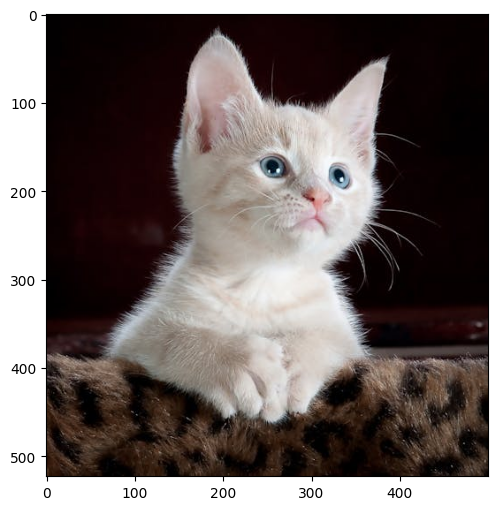

In [ ]:
img=Image.open("/content/drive/MyDrive/cat1.jpeg")
plt.figure(figsize=(9,6))
plt.imshow(img)

In [ ]:
import sys
img_width,img_height=img.size
img_size=img_width*img_height
original_img_size=img_size*sys.getsizeof(img)
print("original_img_size is",original_img_size)

original_img_size is 12552000


Convert Image to Grayscale and show

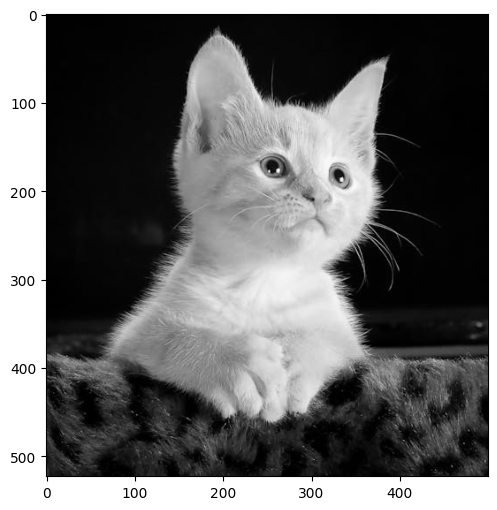

In [ ]:
gray_img=img.convert('LA')
plt.figure(figsize=(9,6))
plt.imshow(gray_img)

Convert image to a matrix  and show that its values can be  rendered as pixel colors

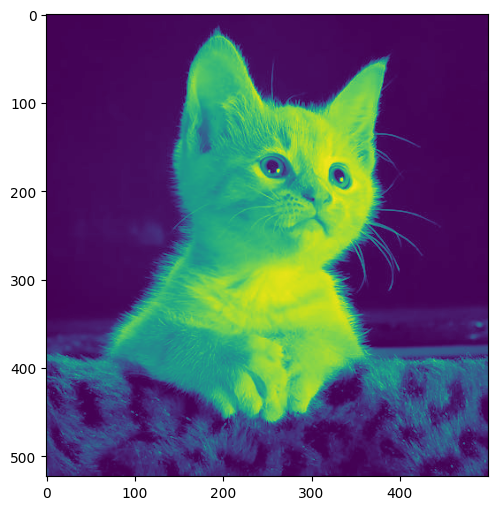

In [ ]:
imgmat=np.array(list(gray_img.getdata(band=0)),float)
imgmat.shape=(gray_img.size[1],gray_img.size[0])
imgmat=np.matrix(imgmat)
plt.figure(figsize=(9,6))
plt.imshow(imgmat)

Computer the Singular Value Decomposition

In [ ]:
imgmat.shape

(523, 500)

In [ ]:
u,sigma,v=np.linalg.svd(imgmat)

In [ ]:
u.shape

(523, 523)

In [ ]:
sigma.shape

(500,)

In [ ]:
v.shape

(500, 500)

In [ ]:
sigma[0]

50016.55415544995

Keep a Specified number of terms as(i=1,2,3,......)

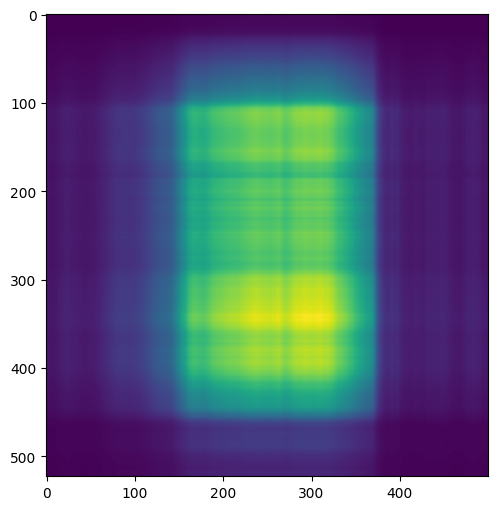

In [ ]:
i=1 # here term number is 'i'
restored_img=np.matrix(u[:,:i]*np.diag(sigma[:i])*np.matrix(v[:i,:]))
plt.figure(figsize=(9,6))
plt.imshow(restored_img);

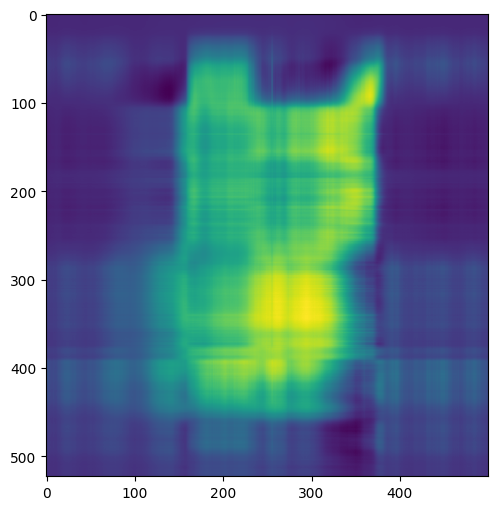

In [ ]:
i=3
restored_img=np.matrix(u[:,:i]*np.diag(sigma[:i])*np.matrix(v[:i,:]))
plt.figure(figsize=(9,6))
plt.imshow(restored_img);

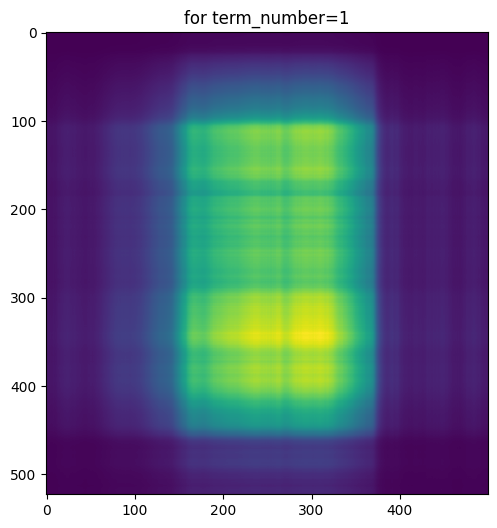

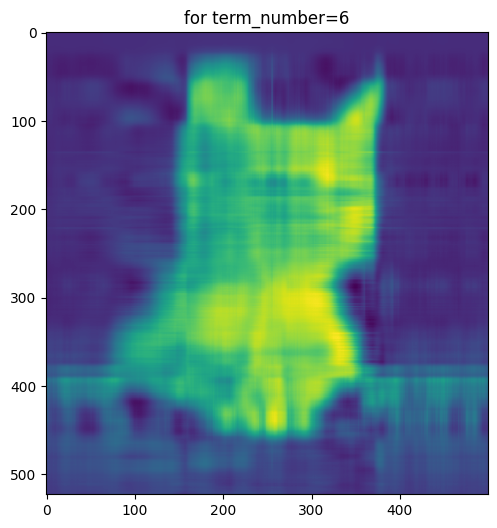

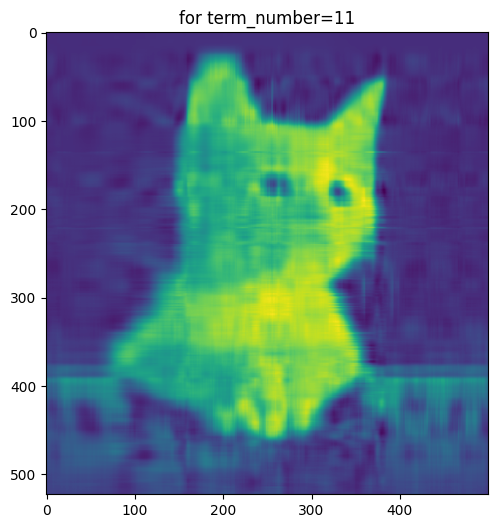

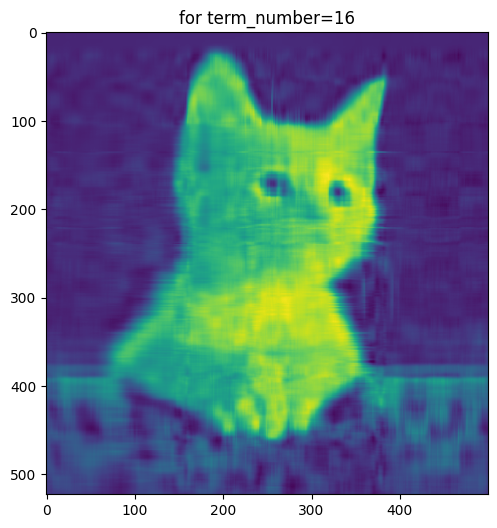

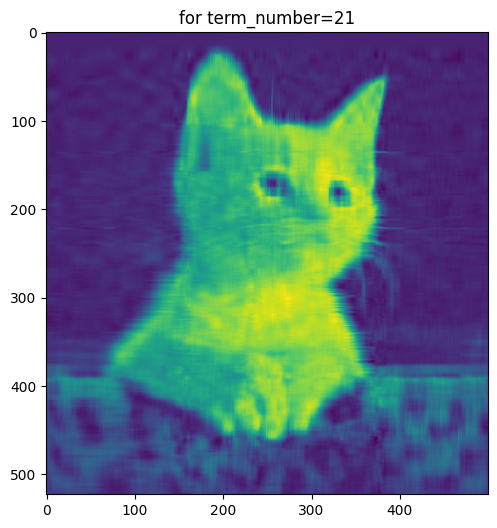

...

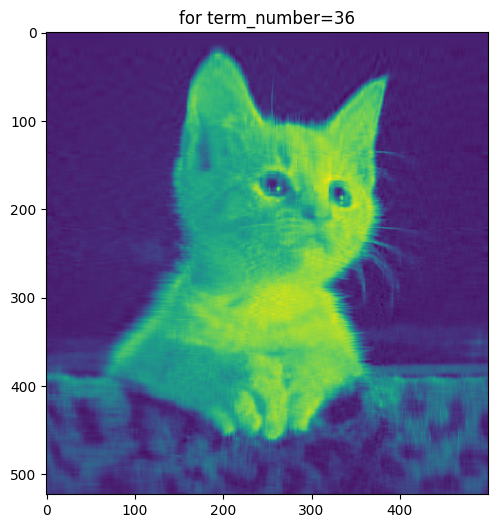

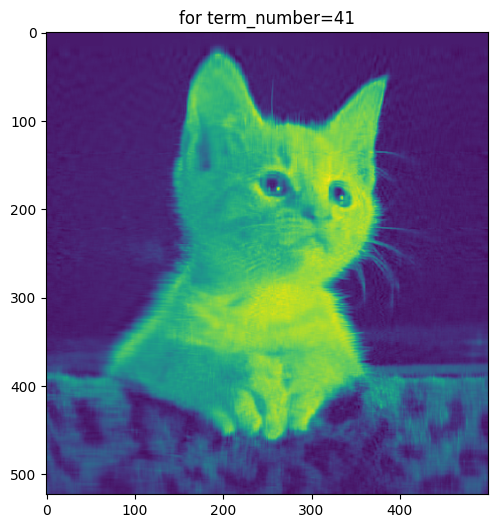

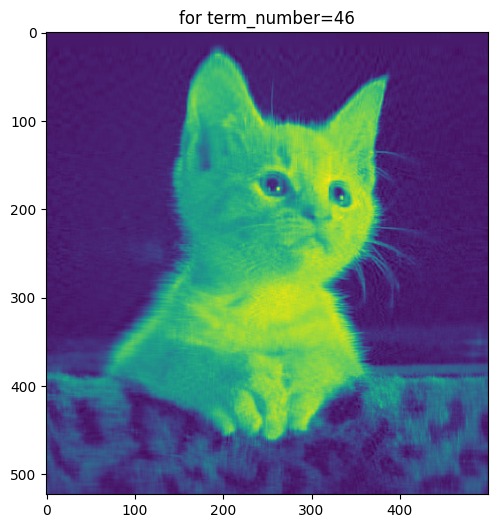

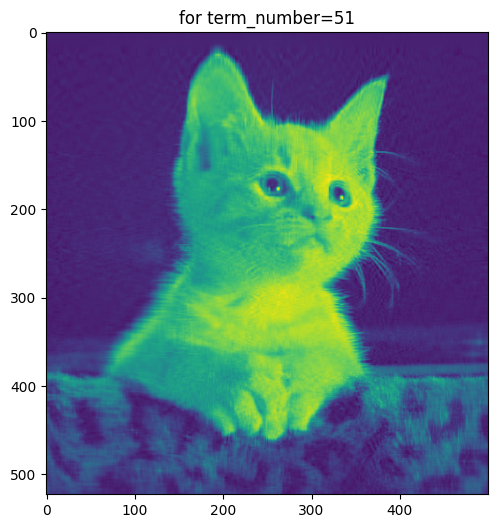

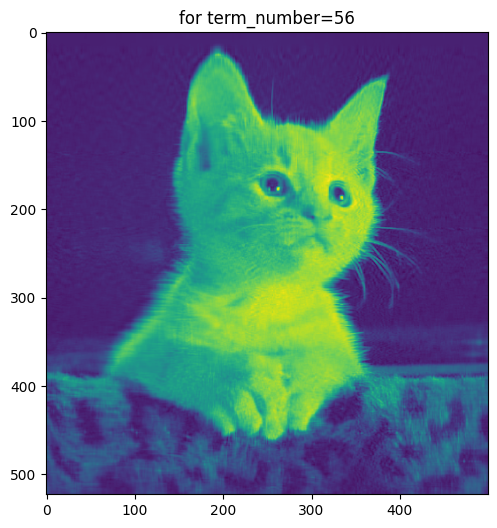

In [ ]:
for i in range(1,61,5):
  restored_img=np.matrix(u[:,:i]*np.diag(sigma[:i])*np.matrix(v[:i,:]))
  plt.figure(figsize=(9,6))
  plt.imshow(restored_img);
  plt.title(f'for term_number={i}')



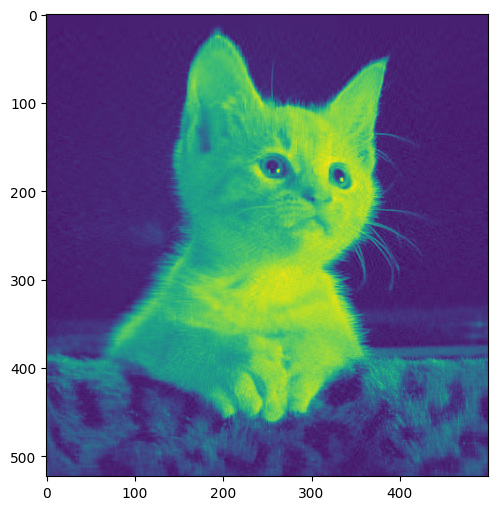

In [ ]:
i=66
restored_img=np.matrix(u[:,:i]*np.diag(sigma[:i])*np.matrix(v[:i,:]))
plt.figure(figsize=(9,6))
plt.imshow(restored_img);

In [ ]:
size_of_sigma=sigma.size*sys.getsizeof(sigma)
size_of_u=u.size*sys.getsizeof(u)
size_of_v=v.size*sys.getsizeof(v)

In [ ]:
restored_img_size=sigma.size+u.size+v.size
print(restored_img_size)

524029


In [ ]:
print(" compression ratio is",restored_img_size/original_img_size)

 compression ratio is 0.041748645634161884


Let's see how large the sigma values are;

Text(0, 0.5, 'sigma_i')

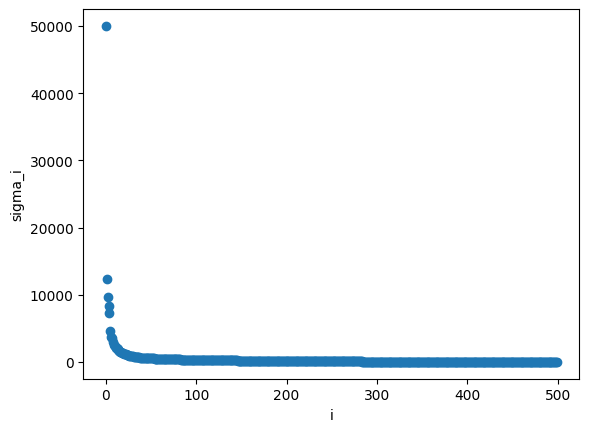

In [ ]:
plt.plot(sigma,'o')
plt.xlabel('i')
plt.ylabel('sigma_i')

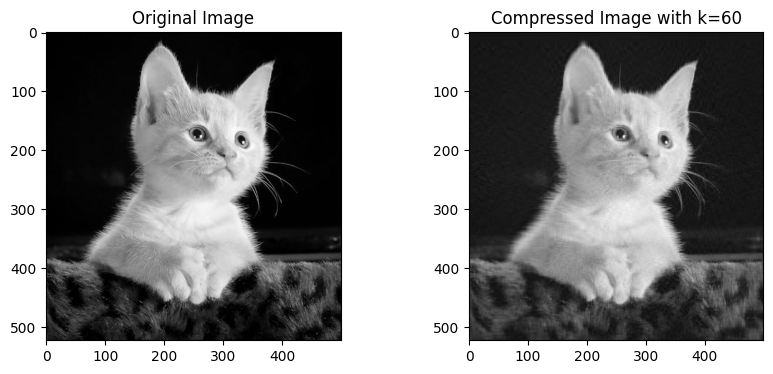

Original size: 261500 elements
Compressed size: 61440 elements
Compression Ratio: 0.23


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def load_image(image_path):
    image = io.imread(image_path)
    gray_image = color.rgb2gray(image)
    return gray_image

def apply_svd(image):
    U, S, Vt = np.linalg.svd(image, full_matrices=False)
    return U, S, Vt

def reconstruct_image(U_k, S_k, Vt_k):
    return np.dot(U_k, np.dot(np.diag(S_k), Vt_k))

def calculate_compression_ratio(original, U_k, S_k, Vt_k):
    original_size = original.size
    compressed_size = U_k.size + S_k.size + Vt_k.size
    return compressed_size / original_size

image = load_image('/content/drive/MyDrive/cat1.jpeg')
U, S, Vt = apply_svd(image)

k =60  # Number of singular values to keep
U_k = U[:, :k]
S_k = S[:k]
Vt_k = Vt[:k, :]

compressed_image = reconstruct_image(U_k, S_k, Vt_k)

# Visualize the original and compressed images
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(compressed_image, cmap='gray')
plt.title(f'Compressed Image with k={k}')
plt.show()

# Calculate and print the compression ratio
compression_ratio = calculate_compression_ratio(image, U_k, S_k, Vt_k)
print(f'Original size: {image.size} elements')
print(f'Compressed size: {U_k.size + S_k.size + Vt_k.size} elements')
print(f'Compression Ratio: {compression_ratio:.2f}')




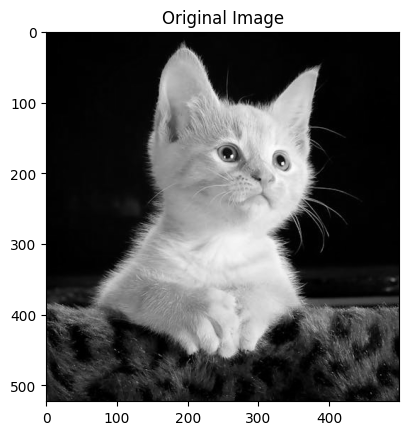

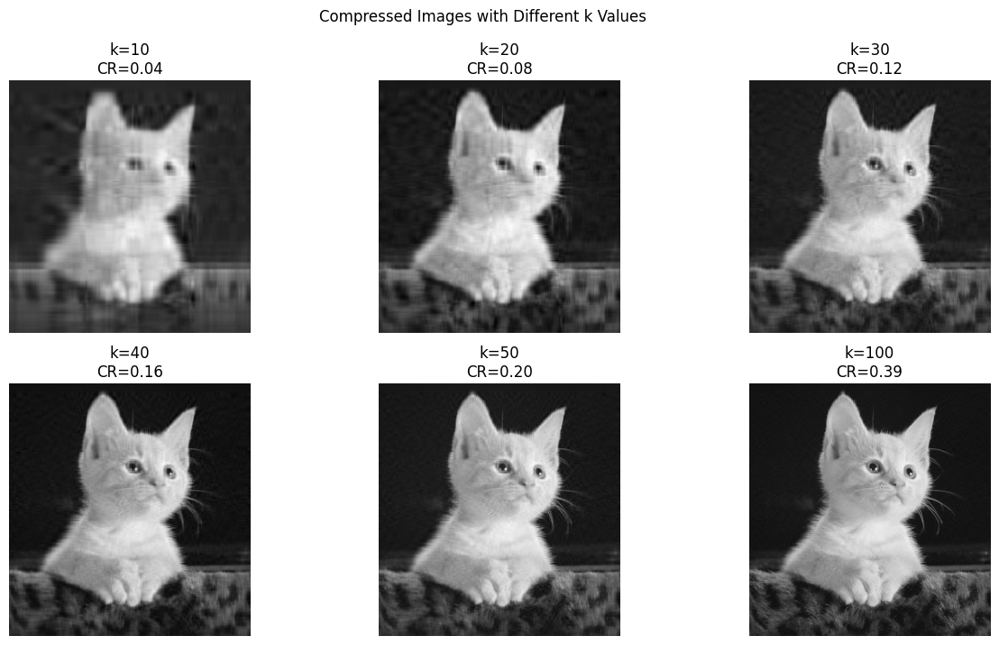

Quality Metrics for k=50:
MSE: 0.00
PSNR: 30.81 dB


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def load_image(image_path):
    image = io.imread(image_path)
    gray_image = color.rgb2gray(image)
    return gray_image

image = load_image('/content/drive/MyDrive/cat1.jpeg')
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.show()
def apply_svd(image):
    U, S, Vt = np.linalg.svd(image, full_matrices=False)
    return U, S, Vt

U, S, Vt = apply_svd(image)
def reconstruct_image(U, S, Vt, k):
    U_k = U[:, :k]
    S_k = S[:k]
    Vt_k = Vt[:k, :]
    return np.dot(U_k, np.dot(np.diag(S_k), Vt_k))

def calculate_compression_ratio(original, U_k, S_k, Vt_k):
    original_size = original.size  # Total number of pixels (elements) in the original image
    compressed_size = U_k.size + S_k.size + Vt_k.size  # Elements in U_k, S_k, and Vt_k
    return compressed_size / original_size
ks = [10, 20, 30, 40, 50, 100]  # Different values of k to test

plt.figure(figsize=(15, 8))
for i, k in enumerate(ks, 1):
    compressed_image = reconstruct_image(U, S, Vt, k)
    compression_ratio = calculate_compression_ratio(image, U[:, :k], S[:k], Vt[:k, :])

    # Display the compressed image
    plt.subplot(2, len(ks) // 2, i)
    plt.imshow(compressed_image, cmap='gray')
    plt.title(f'k={k}\nCR={compression_ratio:.2f}')
    plt.axis('off')

plt.suptitle('Compressed Images with Different k Values')
plt.show()
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio

def evaluate_quality(original, compressed):
    mse = mean_squared_error(original, compressed)
    psnr = peak_signal_noise_ratio(original, compressed, data_range=original.max() - original.min())
    return mse, psnr

# Example for a specific k
k = 50
compressed_image = reconstruct_image(U, S, Vt, k)
mse, psnr = evaluate_quality(image, compressed_image)

print(f'Quality Metrics for k={k}:')
print(f'MSE: {mse:.2f}')
print(f'PSNR: {psnr:.2f} dB')


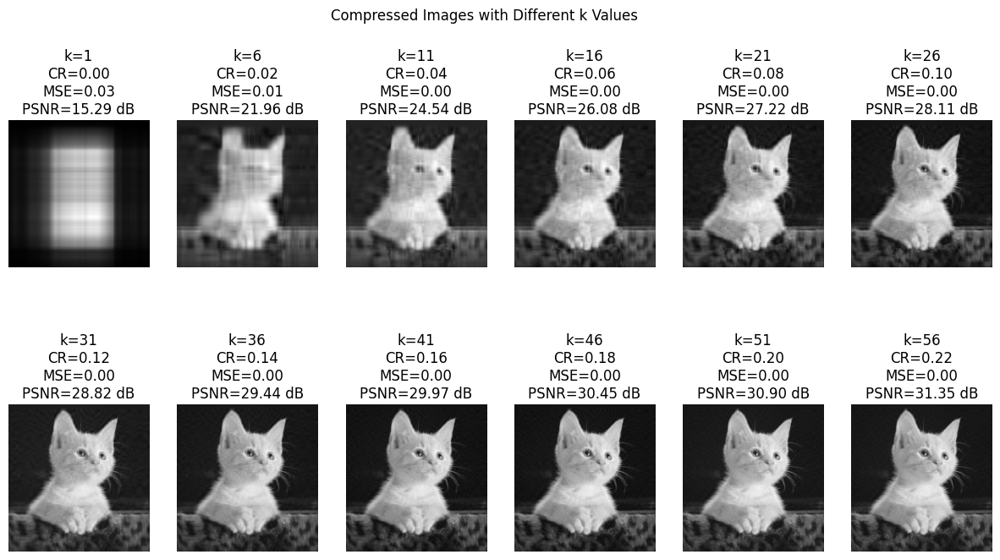

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio

def load_image(image_path):
    image = io.imread(image_path)
    gray_image = color.rgb2gray(image)
    return gray_image

def apply_svd(image):
    U, S, Vt = np.linalg.svd(image, full_matrices=False)
    return U, S, Vt

def reconstruct_image(U, S, Vt, k):
    U_k = U[:, :k]
    S_k = S[:k]
    Vt_k = Vt[:k, :]
    return np.dot(U_k, np.dot(np.diag(S_k), Vt_k))

def calculate_compression_ratio(original, U_k, S_k, Vt_k):
    original_size = original.size
    compressed_size = U_k.size + S_k.size + Vt_k.size
    return compressed_size / original_size

def evaluate_quality(original, compressed):
    mse = mean_squared_error(original, compressed)
    psnr = peak_signal_noise_ratio(original, compressed, data_range=original.max() - original.min())
    return mse, psnr

image = load_image('/content/drive/MyDrive/cat1.jpeg')
U, S, Vt = apply_svd(image)

ks = list(range(1,61,5))  # Different values of k to test

plt.figure(figsize=(15, 8))
for i, k in enumerate(ks, 1):
    compressed_image = reconstruct_image(U, S, Vt, k)
    compression_ratio = calculate_compression_ratio(image, U[:, :k], S[:k], Vt[:k, :])
    mse, psnr = evaluate_quality(image, compressed_image)

    # Display the compressed image
    plt.subplot(2, len(ks) // 2, i)
    plt.imshow(compressed_image, cmap='gray')
    plt.title(f'k={k}\nCR={compression_ratio:.2f}\nMSE={mse:.2f}\nPSNR={psnr:.2f} dB')
    plt.axis('off')

plt.suptitle('Compressed Images with Different k Values')
plt.show()
